<a href="https://colab.research.google.com/github/Oreniscool/happiness-index/blob/main/happiness_predictor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#initalization and data loading
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv('./happiness_report.csv')
#data = pd.read_csv('DataForTable2.1.csv')

data.head()

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
0,Afghanistan,2008,3.724,7.350,0.451,50.5,0.718,0.164,0.882,0.414,0.258
1,Afghanistan,2009,4.402,7.509,0.552,50.8,0.679,0.187,0.850,0.481,0.237
2,Afghanistan,2010,4.758,7.614,0.539,51.1,0.600,0.118,0.707,0.517,0.275
3,Afghanistan,2011,3.832,7.581,0.521,51.4,0.496,0.160,0.731,0.480,0.267
4,Afghanistan,2012,3.783,7.661,0.521,51.7,0.531,0.234,0.776,0.614,0.268


#### **Member 1: Week 1**

- *Dataset Understanding* (3 hours)
   - Review dataset structure and summarize key characteristics (number of rows, columns, features).
- *Missing Data Handling* (3 hours)
   - Identify missing data patterns and decide how to handle them (fill, drop).

- *Normalization & Encoding* (4 hours)
   - Normalize numeric data (e.g., age) and encode categorical variables (e.g., country, event).
- *Data Splitting* (2 hours)
   - Split data into training and testing sets.

- *Documentation and Code Commenting* (3 hours)
   - Document the steps of preprocessing and write detailed code comments.
- *Collaboration with Member 2* (1 hour)
   - Ensure data is ready for exploration.


In [2]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

# Review dataset structure and summarize key characteristics
num_rows, num_columns = data.shape
columns = data.columns.tolist()
summary = data.describe()

# Display basic structure of the dataset
structure_summary = {
    "Number of rows": num_rows,
    "Number of columns": num_columns,
    "Columns": columns,
    "Summary statistics": summary
}
print("Dataset Structure Summary:")
for key, value in structure_summary.items():
    print(f"{key}: {value}")

# Identify missing data patterns
missing_data = data.isnull().sum()
missing_data_percentage = (missing_data / len(data)) * 100
missing_data_summary = pd.DataFrame({
    "Missing Values": missing_data,
    "Percentage": missing_data_percentage
}).sort_values(by="Percentage", ascending=False)

print("\nMissing Data Summary:")
print(missing_data_summary)

# Handle missing data
numeric_columns = data.select_dtypes(include=['number']).columns
fill_columns = missing_data_summary[
    (missing_data_summary["Percentage"] < 2) &
    (missing_data_summary.index.isin(numeric_columns))
].index
data[fill_columns] = data[fill_columns].apply(lambda col: col.fillna(col.median()), axis=0)

# Drop rows with missing values in columns with >2% missing data
drop_columns = missing_data_summary[missing_data_summary["Percentage"] >= 2].index
data = data.dropna(subset=drop_columns)

# Verify if missing values are handled
final_missing_data = data.isnull().sum()
final_missing_data_summary = pd.DataFrame({
    "Missing Values After Handling": final_missing_data,
    "Percentage After Handling": (final_missing_data / len(data)) * 100
}).sort_values(by="Percentage After Handling", ascending=False)

print("\nFinal Missing Data Summary After Handling:")
print(final_missing_data_summary)

# Separate numeric and categorical columns
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = data.select_dtypes(include=['object']).columns

print("\nNumeric columns:", numeric_columns.tolist())
print("Categorical columns:", categorical_columns.tolist())

# Initialize the StandardScaler for normalization
scaler = StandardScaler()

# Normalize numeric columns
normalized_data = data.copy()
normalized_data[numeric_columns] = scaler.fit_transform(data[numeric_columns])

# Encode categorical variables
label_encoders = {}
for column in categorical_columns:
    label_encoders[column] = LabelEncoder()
    normalized_data[column] = label_encoders[column].fit_transform(data[column])

# Split features and target (assuming you want to predict a specific column)
# Replace 'target_column' with your actual target column name
target_column = 'your_target_column'  # Update this with your target column
if target_column in normalized_data.columns:
    X = normalized_data.drop(columns=[target_column])
    y = normalized_data[target_column]
else:
    # If no specific target column, use all data as features
    X = normalized_data
    y = None

# Split the data into training and testing sets
if y is not None:
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )
    print("\nTraining set shape:", X_train.shape)
    print("Testing set shape:", X_test.shape)
else:
    # If no target variable, split only X
    X_train, X_test = train_test_split(
        X, test_size=0.2, random_state=42
    )
    print("\nTraining set shape:", X_train.shape)
    print("Testing set shape:", X_test.shape)

# Save the preprocessed data (optional)
normalized_data.to_csv('preprocessed_data.csv', index=False)

# Print summary of transformations
print("\nPreprocessing Summary:")
print("1. Normalized numeric columns using StandardScaler")
print("2. Encoded categorical columns using LabelEncoder")
print("3. Split data into training (80%) and testing (20%) sets")
print("\nNormalized and encoded data shape:", normalized_data.shape)

Dataset Structure Summary:
Number of rows: 2363
Number of columns: 11
Columns: ['Country name', 'year', 'Life Ladder', 'Log GDP per capita', 'Social support', 'Healthy life expectancy at birth', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 'Positive affect', 'Negative affect']
Summary statistics:               year  Life Ladder  Log GDP per capita  Social support  \
count  2363.000000  2363.000000         2335.000000     2350.000000   
mean   2014.763860     5.483566            9.399671        0.809369   
std       5.059436     1.125522            1.152069        0.121212   
min    2005.000000     1.281000            5.527000        0.228000   
25%    2011.000000     4.647000            8.506500        0.744000   
50%    2015.000000     5.449000            9.503000        0.834500   
75%    2019.000000     6.323500           10.392500        0.904000   
max    2023.000000     8.019000           11.676000        0.987000   

       Healthy life expectancy a

## Member 2 Week 1
- *Basic EDA* (3 hours)
   - Compute summary statistics (mean, median, etc.).
- *Basic Visualizations* (3 hours)
   - Generate initial histograms, box plots, and bar graphs to explore distribution.
- *Correlation Analysis* (3 hours)
   - Create a correlation heatmap to find relationships between features.
- *Feature Selection* (4 hours)
   - Identify key features (e.g., age, country, event) based on correlation and dataset analysis.
- *Feature Engineering* (3 hours)
   - Engineer new features (e.g., grouping athletes by age ranges or performance categories).


In [3]:
#Basic EDA
data.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
count,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000
mean,2014.864215,5.463695,9.349736,0.807165,63.264960,0.749075,-0.000105,0.746082,0.653943,0.274662
std,4.984641,1.134302,1.152824,0.123250,6.972604,0.138257,0.161859,0.183766,0.106896,0.085398
min,2005.000000,2.179000,5.527000,0.290000,6.720000,0.258000,-0.340000,0.035000,0.179000,0.094000
25%,2011.000000,4.616000,8.460000,0.738000,58.700000,0.659000,-0.110000,0.689000,0.573000,0.212000
50%,2015.000000,5.425000,9.490000,0.834000,65.040000,0.770000,-0.022000,0.800000,0.664000,0.263000
75%,2019.000000,6.283000,10.310000,0.905000,68.600000,0.859000,0.092000,0.868000,0.740000,0.326000
max,2023.000000,7.971000,11.676000,0.987000,74.600000,0.985000,0.700000,0.983000,0.884000,0.705000


In [4]:
# Ploting trends of positive and negative affect on happiness for each country
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from math import ceil

def analyze_happiness_trends(data):
    # Get unique countries and calculate subplot layout
    countries = data['Country name'].unique()
    n_countries = len(countries)
    n_cols = 2  # You can adjust this for different layouts
    n_rows = ceil(n_countries / n_cols)

    # Create figure with subplots
    fig = plt.figure(figsize=(20, 5 * n_rows))

    # Store trend data
    trends_data = []

    # Create a plot for each country
    for idx, country in enumerate(countries):
        country_data = data[data['Country name'] == country].sort_values('year')

        # Calculate trends
        slope_pos, intercept_pos, r_value_pos, p_value_pos, std_err_pos = stats.linregress(
            country_data['year'], country_data['Positive affect'])
        slope_neg, intercept_neg, r_value_neg, p_value_neg, std_err_neg = stats.linregress(
            country_data['year'], country_data['Negative affect'])

        # Store trend data
        trends_data.append({
            'Country': country,
            'Positive_Slope': slope_pos,
            'Negative_Slope': slope_neg,
            'Pos_P_Value': p_value_pos,
            'Neg_P_Value': p_value_neg
        })

        # Create subplot
        ax = plt.subplot(n_rows, n_cols, idx + 1)

        # Plot positive affect
        ax.plot(country_data['year'], country_data['Positive affect'],
                marker='o', color='green', label='Positive Affect',
                linewidth=2, markersize=8)

        # Plot negative affect
        ax.plot(country_data['year'], country_data['Negative affect'],
                marker='s', color='red', label='Negative Affect',
                linewidth=2, markersize=8, linestyle='--')

        # Add trend lines
        years = country_data['year']
        ax.plot(years, intercept_pos + slope_pos * years,
                color='lightgreen', linestyle=':', alpha=0.8)
        ax.plot(years, intercept_neg + slope_neg * years,
                color='lightcoral', linestyle=':', alpha=0.8)

        # Customize subplot
        ax.set_title(f'{country} Affect Trends')
        ax.set_xlabel('Year')
        ax.set_ylabel('Affect Score')
        ax.grid(True, alpha=0.3)
        ax.legend()

        # Add trend annotations
        ax.text(0.02, 0.98,
                f'Positive trend: {slope_pos:.3f}/year\nNegative trend: {slope_neg:.3f}/year',
                transform=ax.transAxes,
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

        # Set y-axis limits to be consistent across plots
        ax.set_ylim(0, 1)

    plt.tight_layout()

    return pd.DataFrame(trends_data)



# Run analysis and create individual country plots
trends_df = analyze_happiness_trends(data)


plt.show()

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:182: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:196: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:199: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


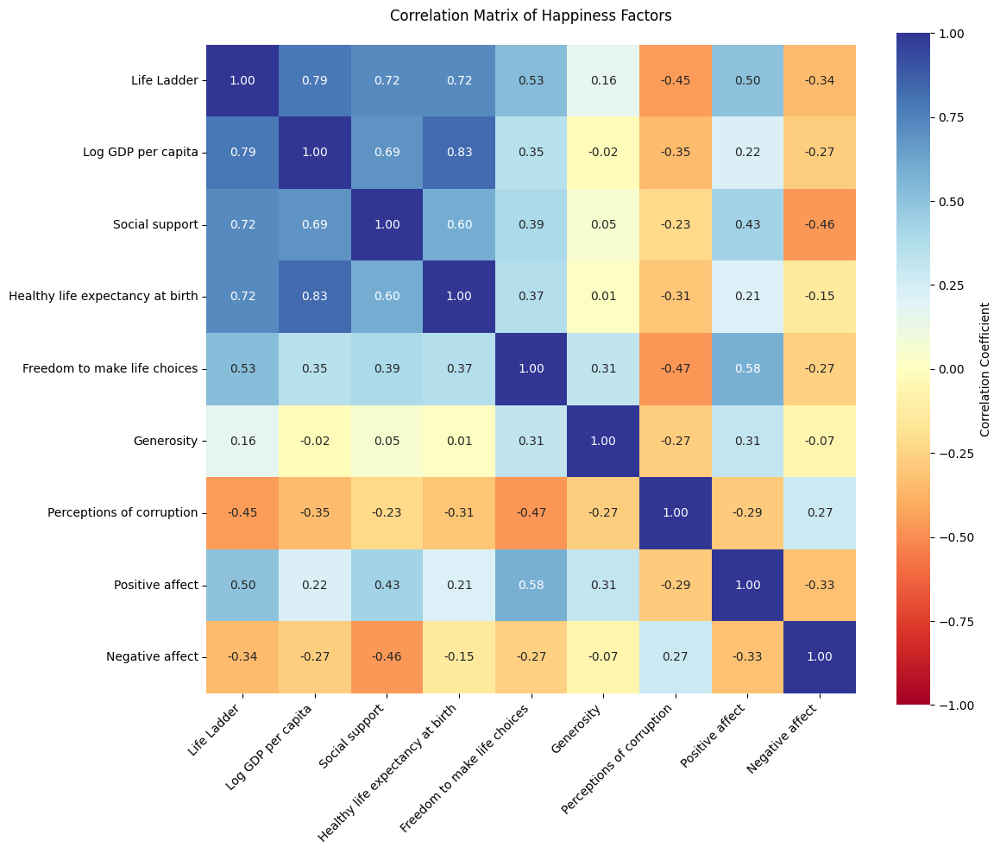

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def create_full_correlation_matrix(data):
    # Select relevant features
    features = ['Life Ladder', 'Log GDP per capita', 'Social support',
                'Healthy life expectancy at birth', 'Freedom to make life choices',
                'Generosity', 'Perceptions of corruption', 'Positive affect', 'Negative affect']

    # Calculate correlation matrix
    correlations = data[features].corr()

    # Create figure
    plt.figure(figsize=(12, 10))

    # Create heatmap
    sns.heatmap(correlations,
                annot=True,        # Show correlation values
                fmt='.2f',         # Round to 2 decimal places
                cmap='RdYlBu',     # Blue-Red diverging colormap
                center=0,          # Center the colormap at 0
                square=True,       # Make cells square
                vmin=-1,          # Minimum correlation value
                vmax=1,           # Maximum correlation value
                cbar_kws={'label': 'Correlation Coefficient'})

    plt.title('Correlation Matrix of Happiness Factors', pad=20)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)

    plt.tight_layout()


create_full_correlation_matrix(data)
plt.show()

In [6]:

def select_features_correlation(df, target_column, correlation_threshold=0.7, plot_correlation=True):
    # Calculate correlation matrix
    features = ['Life Ladder', 'Log GDP per capita', 'Social support',
                'Healthy life expectancy at birth', 'Freedom to make life choices',
                'Generosity', 'Perceptions of corruption',"Positive affect","Negative affect"]

    correlation_matrix = df[features].corr()


    # Get correlation with target variable
    correlation_with_target = correlation_matrix[target_column].sort_values(ascending=False)
    print("\nCorrelation with target variable ({}):".format(target_column))
    print(correlation_with_target)

    # Remove target variable from features
    features = correlation_matrix.drop(target_column).columns

    # Initialize list of selected features
    selected_features = []

    # Iterate through features and select based on correlation
    for feature in features:
        # Skip if feature is already selected
        if feature in selected_features:
            continue

        # Check correlation with already selected features
        if not selected_features:
            selected_features.append(feature)
        else:
            correlations = correlation_matrix.loc[feature, selected_features]
            if not any(abs(correlations) >= correlation_threshold):
                selected_features.append(feature)
    return selected_features, correlation_with_target


# Select features
selected_features,correlation_with_target = select_features_correlation(data,target_column="Positive affect")

# Print selected features
print("\nSelected features: (Threshold=0.8)")
print(selected_features)


Correlation with target variable (Positive affect):
Positive affect                     1.000000
Freedom to make life choices        0.580693
Life Ladder                         0.501484
Social support                      0.425002
Generosity                          0.310120
Log GDP per capita                  0.222649
Healthy life expectancy at birth    0.212349
Perceptions of corruption          -0.287705
Negative affect                    -0.326562
Name: Positive affect, dtype: float64

Selected features: (Threshold=0.8)
['Life Ladder', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 'Positive affect', 'Negative affect']


In [7]:
# Creating new dataset after feature selection
selected_features.extend(["Country name","year"])
data_new = data[selected_features]
data_new

,Life Ladder,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Country name,year
0,3.724,0.718,0.164,0.882,0.414,0.258,Afghanistan,2008
1,4.402,0.679,0.187,0.850,0.481,0.237,Afghanistan,2009
2,4.758,0.600,0.118,0.707,0.517,0.275,Afghanistan,2010
3,3.832,0.496,0.160,0.731,0.480,0.267,Afghanistan,2011
4,3.783,0.531,0.234,0.776,0.614,0.268,Afghanistan,2012
...,...,...,...,...,...,...,...,...
2358,2.694,0.632,-0.051,0.831,0.658,0.235,Zimbabwe,2019
2359,3.160,0.643,0.003,0.789,0.661,0.346,Zimbabwe,2020
2360,3.155,0.668,-0.079,0.757,0.610,0.242,Zimbabwe,2021
2361,3.296,0.652,-0.073,0.753,0.641,0.191,Zimbabwe,2022


In [8]:
#Feature engineering

#combined effect of freedom and corruption
data_new['Freedom_Corruption'] = data_new['Freedom to make life choices'] * data_new['Perceptions of corruption']
#combined effect of happiness and freedom
data_new['Happiness_Freedom'] = data_new['Life Ladder'] * data_new['Freedom to make life choices']


window_size = 15  # Change this value to adjust the rolling window size

# List of columns to apply rolling mean
columns_to_roll = ['Life Ladder', 'Freedom to make life choices', 'Generosity',
                   'Perceptions of corruption', 'Positive affect', 'Negative affect']

# Apply rolling mean within each country
for col in columns_to_roll:
    data_new[f'{col}_RollingMean_{window_size}'] = (
        data_new.groupby('Country name')[col]
        .transform(lambda x: x.rolling(window=window_size, min_periods=1).mean())
    )
data_new

<ipython-input-8-7f4ed73430ba>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_new['Freedom_Corruption'] = data_new['Freedom to make life choices'] * data_new['Perceptions of corruption']
<ipython-input-8-7f4ed73430ba>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_new['Happiness_Freedom'] = data_new['Life Ladder'] * data_new['Freedom to make life choices']


,Life Ladder,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Country name,year,Freedom_Corruption,Happiness_Freedom,Life Ladder_RollingMean_15,Freedom to make life choices_RollingMean_15,Generosity_RollingMean_15,Perceptions of corruption_RollingMean_15,Positive affect_RollingMean_15,Negative affect_RollingMean_15
0,3.724,0.718,0.164,0.882,0.414,0.258,Afghanistan,2008,0.633276,2.673832,3.724000,0.718000,0.164000,0.882000,0.414000,0.258000
1,4.402,0.679,0.187,0.850,0.481,0.237,Afghanistan,2009,0.577150,2.988958,4.063000,0.698500,0.175500,0.866000,0.447500,0.247500
2,4.758,0.600,0.118,0.707,0.517,0.275,Afghanistan,2010,0.424200,2.854800,4.294667,0.665667,0.156333,0.813000,0.470667,0.256667
3,3.832,0.496,0.160,0.731,0.480,0.267,Afghanistan,2011,0.362576,1.900672,4.179000,0.623250,0.157250,0.792500,0.473000,0.259250
4,3.783,0.531,0.234,0.776,0.614,0.268,Afghanistan,2012,0.412056,2.008773,4.099800,0.604800,0.172600,0.789200,0.501200,0.261000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2358,2.694,0.632,-0.051,0.831,0.658,0.235,Zimbabwe,2019,0.525192,1.702608,3.934214,0.584000,-0.075786,0.848143,0.654214,0.215714
2359,3.160,0.643,0.003,0.789,0.661,0.346,Zimbabwe,2020,0.507327,2.031880,3.882600,0.587933,-0.070533,0.844200,0.654667,0.224400
2360,3.155,0.668,-0.079,0.757,0.610,0.242,Zimbabwe,2021,0.505676,2.107540,3.837867,0.603733,-0.071600,0.834333,0.650733,0.220733
2361,3.296,0.652,-0.073,0.753,0.641,0.191,Zimbabwe,2022,0.490956,2.148992,3.838933,0.616800,-0.071867,0.821467,0.654200,0.215800


# **Member 3: Week 1**
#### *Member 3: Model Research & Justification (20 hours total)*

*Day 1-2 (4 hours)*:
- *Model Research* (4 hours)
   - Research and identify machine learning models (Logistic Regression, Decision Trees, Random Forest, etc.) suitable for this dataset.

*Day 3-5 (4 hours)*:
- *Model Justification* (4 hours)
   - Justify model choices based on dataset characteristics and project goals (e.g., classification of medal winners).

*Day 6-7 (3 hours)*:
- *Initial Model Setup* (3 hours)
   - Set up the environment (libraries like Scikit-learn) and write initial code for model implementation. italicised text


---
# **Model Research**
The selected features of the dataset include columns namely :
- Life Ladder (Numerical)
- Freedom to make life choices (Numerical)
- Generosity (Numerical)
- Perceptions of corruption (Numerical)
- Positive affect (Numerical)
- Negative affect (Numerical)

For a comprehensive analysis, a mix of supervised and unsupervised learning models would be useful


**1)**  **Prediction** (Supervised Learning)

If the goal is to predict the "Life Ladder" (well-being/happiness levels) or another specific feature:
- Linear Regression or Decision Trees: For straightforward predictions of "Life Ladder" based on the other socioeconomic factors.
- Random Forests or Gradient Boosting: These are effective if nonlinear relationships exist and may improve prediction accuracy.
- Neural Networks: If the data is extensive, neural networks might capture complex relationships, though they require tuning.

For time-series predictions based on the year:
- ARIMA or LSTM (Long Short-Term Memory networks): For forecasting changes over time, such as how the "Life Ladder" might evolve given historical trends.

**2)** **Clustering** (Unsupervised Learning)
For grouping countries based on similar socioeconomic factors:
- K-Means or Hierarchical Clustering: Effective for creating clusters of countries with similar patterns in happiness and socioeconomic factors.
- DBSCAN: A density-based algorithm useful if clusters are irregularly shaped or if the dataset has noise.


**3)** **Exploratory Analysis** (Unsupervised Learning)
To explore relationships and dimensions:
- Principal Component Analysis (PCA): Useful for reducing dimensions and visualizing major patterns.
- t-SNE or UMAP: Good for visualizing high-dimensional relationships, especially if patterns exist within clusters or over time.



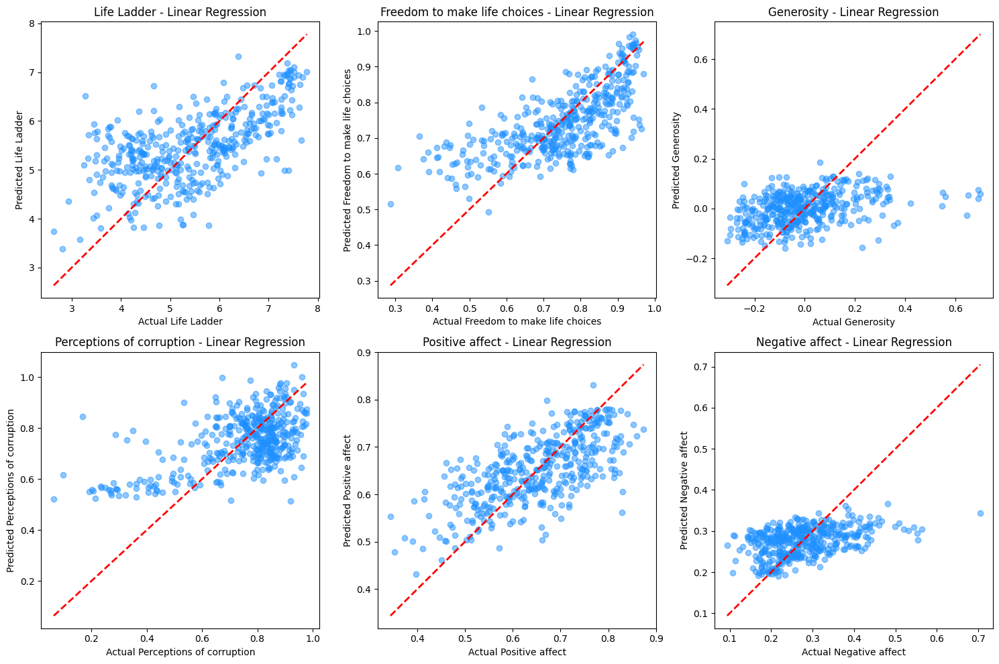

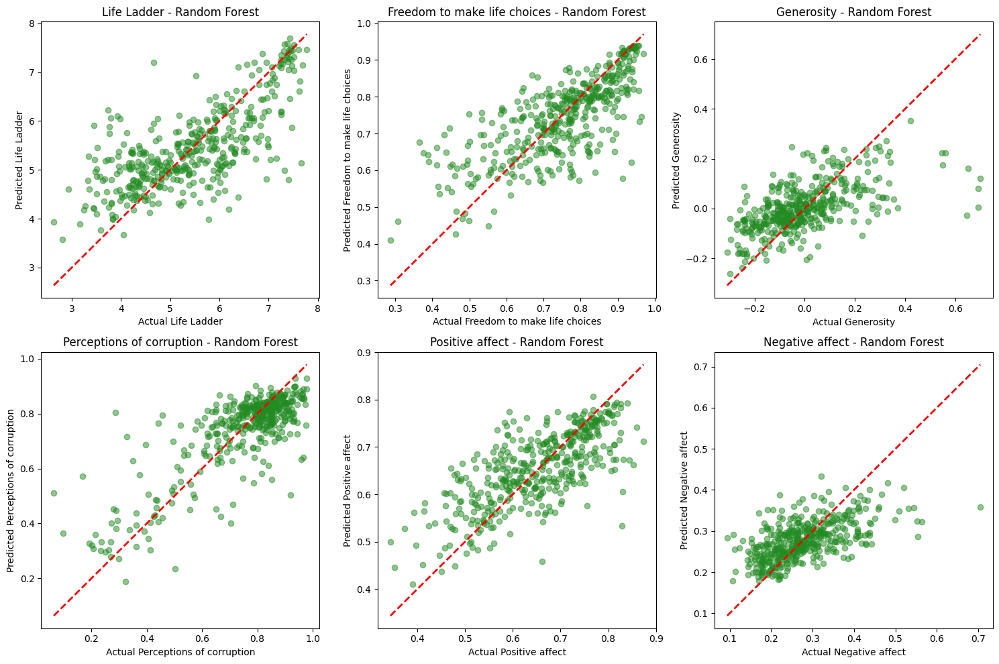

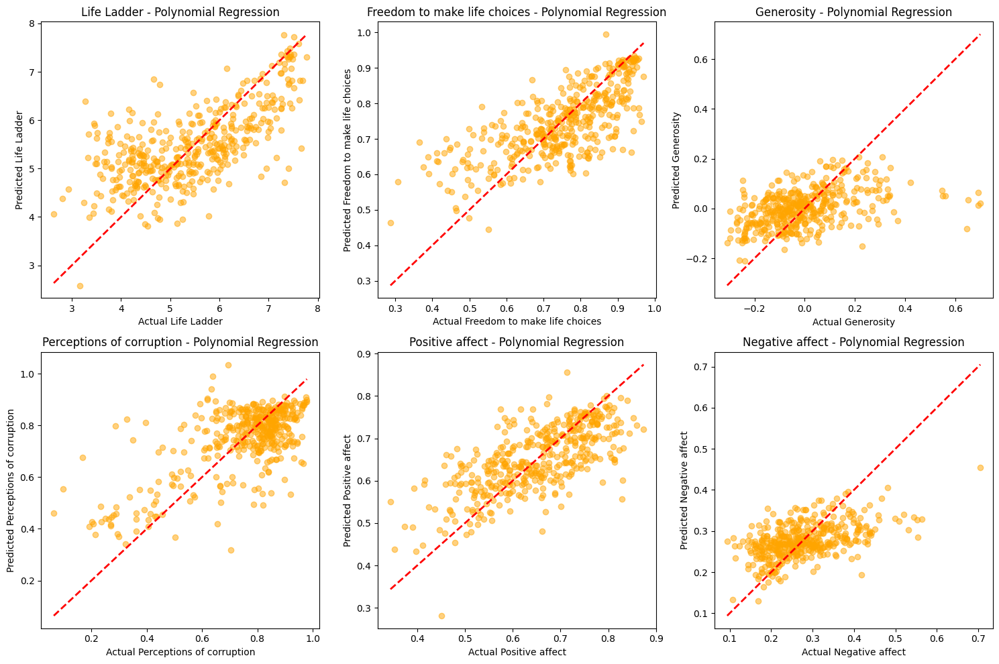

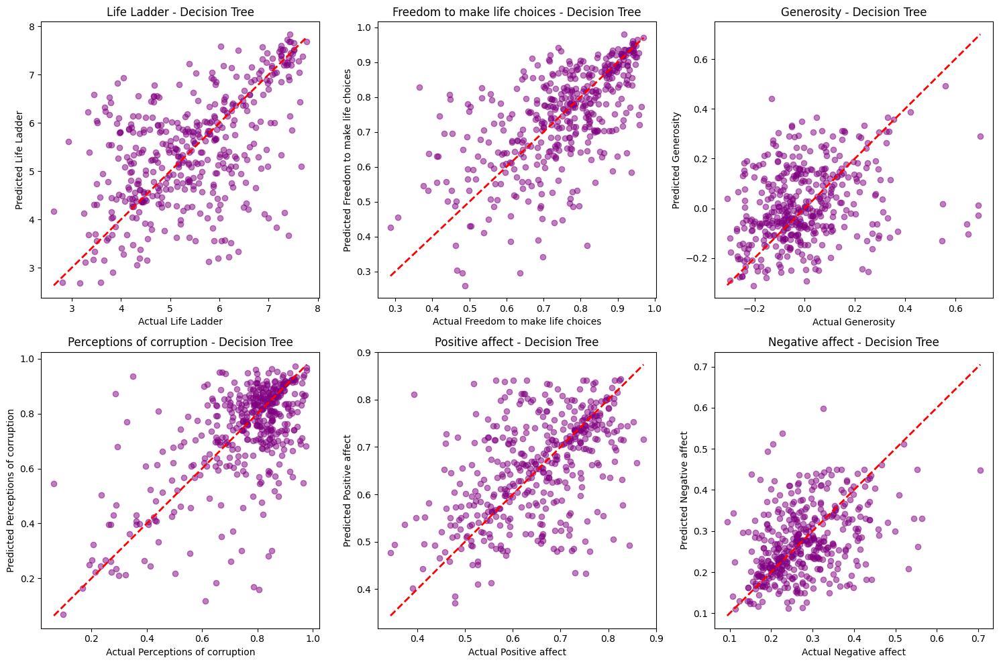

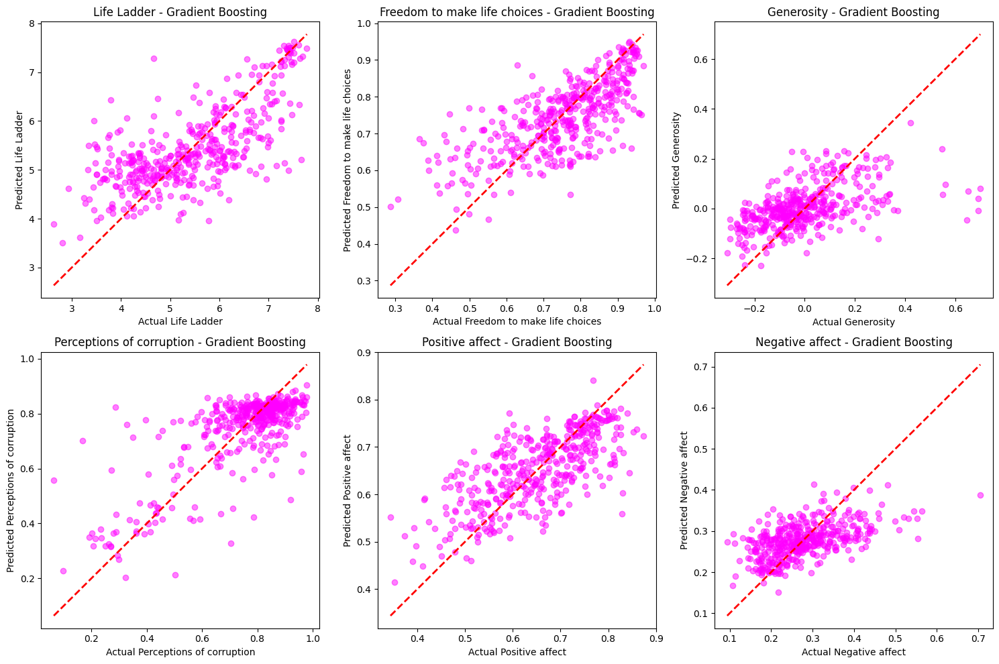

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


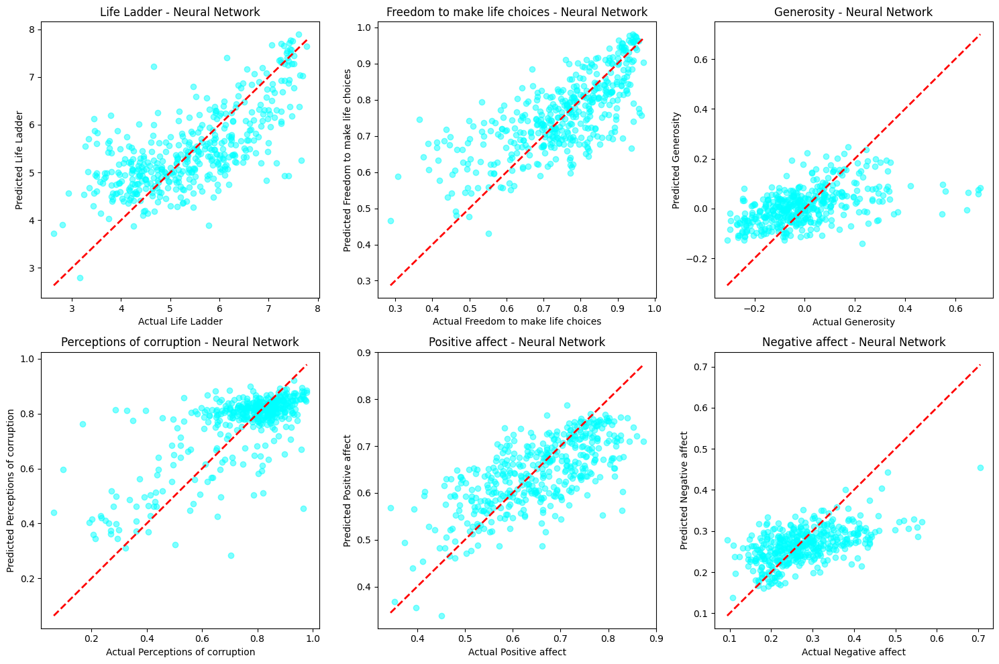

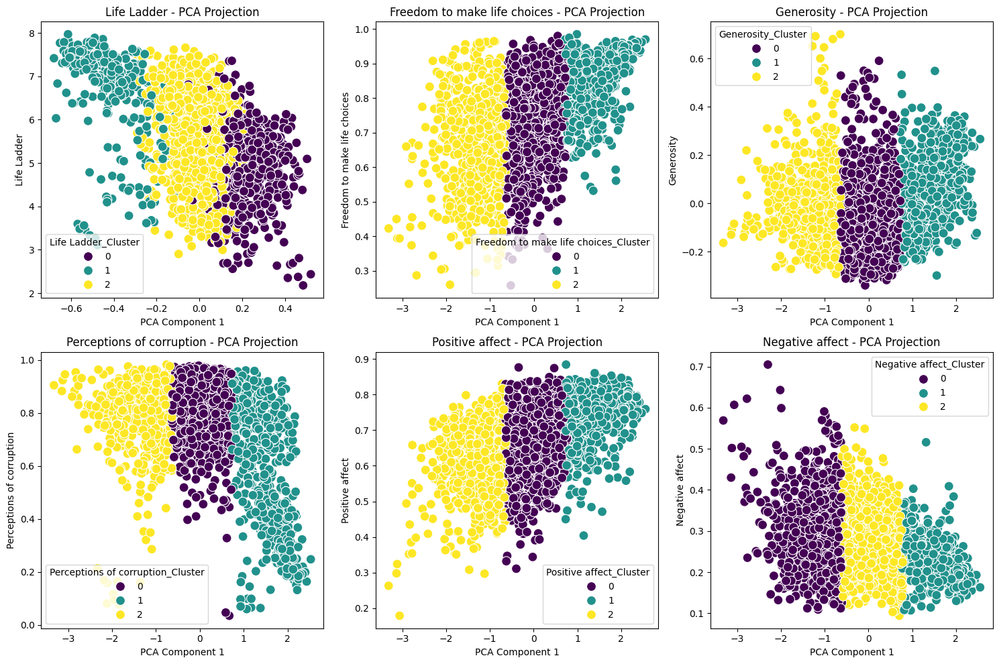

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from keras.models import Sequential
from keras.layers import Dense
# Assuming 'data' is your DataFrame already loaded with relevant columns
# Feature list includes features used for predictions
feature_list = ['Life Ladder','Freedom to make life choices', 'Generosity',
                'Perceptions of corruption', 'Positive affect', 'Negative affect']

# 1. Linear Regression Plots
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns

for i, target_feature in enumerate(feature_list):
    features = data_new[feature_list].drop(columns=[target_feature])  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    linear_reg = LinearRegression()
    linear_reg.fit(X_train, y_train)
    y_pred_lr = linear_reg.predict(X_test)

    # Linear Regression Plot
    row = i // 3  # Calculate row index
    col = i % 3   # Calculate column index
    ax = axes[row, col]  # Get the current subplot

    ax.scatter(y_test, y_pred_lr, alpha=0.5, color="dodgerblue")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    ax.set_xlabel(f"Actual {target_feature}")
    ax.set_ylabel(f"Predicted {target_feature}")
    ax.set_title(f"{target_feature} - Linear Regression")

plt.tight_layout()
plt.show()

# 2. Random Forest Plots
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns

for i, target_feature in enumerate(feature_list):
    features = data_new[feature_list].drop(columns=[target_feature])  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    random_forest = RandomForestRegressor(random_state=42)
    random_forest.fit(X_train, y_train)
    y_pred_rf = random_forest.predict(X_test)

    # Random Forest Plot
    row = i // 3  # Calculate row index
    col = i % 3   # Calculate column index
    ax = axes[row, col]  # Get the current subplot

    ax.scatter(y_test, y_pred_rf, alpha=0.5, color="forestgreen")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    ax.set_xlabel(f"Actual {target_feature}")
    ax.set_ylabel(f"Predicted {target_feature}")
    ax.set_title(f"{target_feature} - Random Forest")

plt.tight_layout()
plt.show()

# 3. Polynomial Regression Plots
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns

for i, target_feature in enumerate(feature_list):
    features = data_new[feature_list].drop(columns=[target_feature])  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    # Create polynomial features
    poly = PolynomialFeatures(degree=2)  # Change the degree as necessary
    X_poly_train = poly.fit_transform(X_train)
    X_poly_test = poly.transform(X_test)

    poly_reg = LinearRegression()
    poly_reg.fit(X_poly_train, y_train)
    y_pred_poly = poly_reg.predict(X_poly_test)

    # Polynomial Regression Plot
    row = i // 3  # Calculate row index
    col = i % 3   # Calculate column index
    ax = axes[row, col]  # Get the current subplot


    # Instead of using sorted_indices directly, use it to sort y_test values:
    sorted_y_test = np.sort(y_test)

    # Then plot using sorted_y_test and the corresponding predictions:
    ax.scatter(sorted_y_test, y_pred_poly[np.argsort(y_test)], alpha=0.5, color="orange")

    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    ax.set_xlabel(f"Actual {target_feature}")
    ax.set_ylabel(f"Predicted {target_feature}")
    ax.set_title(f"{target_feature} - Polynomial Regression")

plt.tight_layout()
plt.show()

# 4. Decision Tree Regression Plots
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns

for i, target_feature in enumerate(feature_list):
    features = data_new[feature_list].drop(columns=[target_feature])  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    decision_tree = DecisionTreeRegressor(random_state=42)
    decision_tree.fit(X_train, y_train)
    y_pred_dt = decision_tree.predict(X_test)

    # Decision Tree Plot
    row = i // 3  # Calculate row index
    col = i % 3   # Calculate column index
    ax = axes[row, col]  # Get the current subplot

    ax.scatter(y_test, y_pred_dt, alpha=0.5, color="purple")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    ax.set_xlabel(f"Actual {target_feature}")
    ax.set_ylabel(f"Predicted {target_feature}")
    ax.set_title(f"{target_feature} - Decision Tree")

plt.tight_layout()
plt.show()

# 5. Gradient Boosting Regression Plots
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns

for i, target_feature in enumerate(feature_list):
    features = data_new[feature_list].drop(columns=[target_feature])  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    # Gradient Boosting model
    gb_model = GradientBoostingRegressor(random_state=42)
    gb_model.fit(X_train, y_train)
    y_pred_gb = gb_model.predict(X_test)

    # Gradient Boosting Plot
    row = i // 3  # Calculate row index
    col = i % 3   # Calculate column index
    ax = axes[row, col]  # Get the current subplot

    ax.scatter(y_test, y_pred_gb, alpha=0.5, color="magenta")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    ax.set_xlabel(f"Actual {target_feature}")
    ax.set_ylabel(f"Predicted {target_feature}")
    ax.set_title(f"{target_feature} - Gradient Boosting")

plt.tight_layout()
plt.show()

# 6. Neural Network Regression Plots
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns

for i, target_feature in enumerate(feature_list):
    features = data_new[feature_list].drop(columns=[target_feature])  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    # Build the neural network model
    model = Sequential()
    model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))  # Input layer
    model.add(Dense(32, activation='relu'))  # Hidden layer
    model.add(Dense(1, activation='linear'))  # Output layer

    # Compile the model
    model.compile(loss='mean_squared_error', optimizer='adam')

    # Train the model
    model.fit(X_train, y_train, epochs=100, batch_size=10, verbose=0)

    # Predict
    y_pred_nn = model.predict(X_test)

    # Neural Network Plot
    row = i // 3  # Calculate row index
    col = i % 3   # Calculate column index
    ax = axes[row, col]  # Get the current subplot

    ax.scatter(y_test, y_pred_nn, alpha=0.5, color="cyan")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    ax.set_xlabel(f"Actual {target_feature}")
    ax.set_ylabel(f"Predicted {target_feature}")
    ax.set_title(f"{target_feature} - Neural Network")

plt.tight_layout()
plt.show()

# 7. PCA Results
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns

for i, target_feature in enumerate(feature_list):
    features = data[feature_list].drop(columns=[target_feature])  # Use all features except the current target

    # Applying K-Means clustering
    kmeans = KMeans(n_clusters=3, random_state=42)
    clusters = kmeans.fit_predict(features)
    data[f'{target_feature}_Cluster'] = clusters

    # Applying PCA for dimensionality reduction
    pca = PCA(n_components=1)
    pca_component = pca.fit_transform(features)
    data[f'{target_feature}_PCA'] = pca_component[:, 0]

    # Plotting PCA results
    row = i // 3  # Calculate row index
    col = i % 3   # Calculate column index

    # Use axes[row, col] to access the correct subplot
    ax = axes[row, col]
    sns.scatterplot(x=f'{target_feature}_PCA', y=target_feature, hue=f'{target_feature}_Cluster', data=data, palette='viridis', s=100, ax=ax)
    ax.set_title(f"{target_feature} - PCA Projection")
    ax.set_xlabel("PCA Component 1")
    ax.set_ylabel(target_feature)

plt.tight_layout()
plt.show()


## **Member 3 : Week 2 : Model Implementation**

*Day 1-4 (8 hours)*:
- *Model Implementation* (6 hours)
   - Implement machine learning models (Logistic Regression, Decision Trees, Random Forest, etc.).
- *Hyperparameter Tuning* (2 hours)
   - Begin tuning hyperparameters using techniques like grid search or random search.

*Day 5-7 (4 hours)*:
- *Cross-Validation & Testing* (4 hours)
   - Apply cross-validation and test models on the test set. Document results.




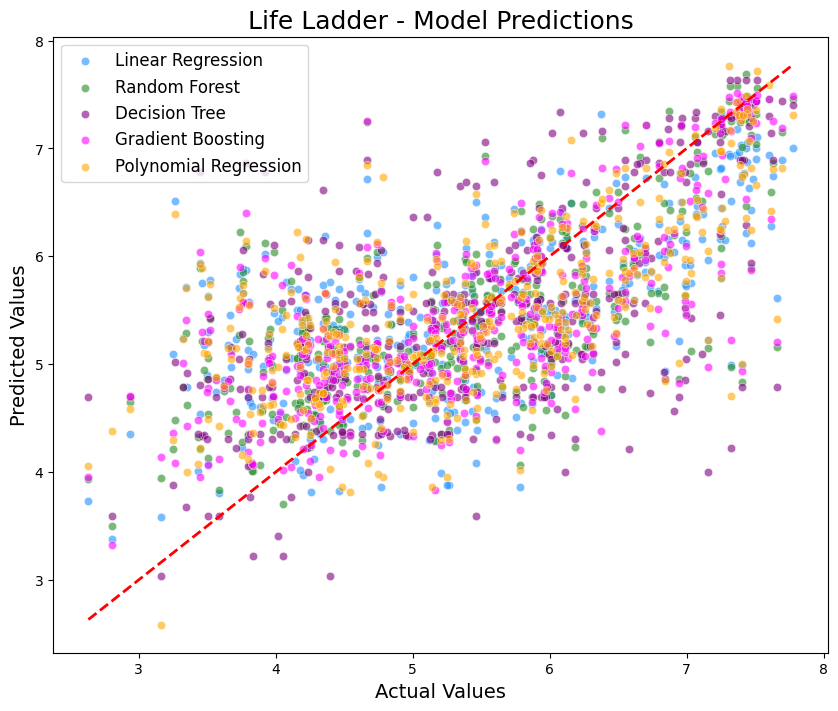

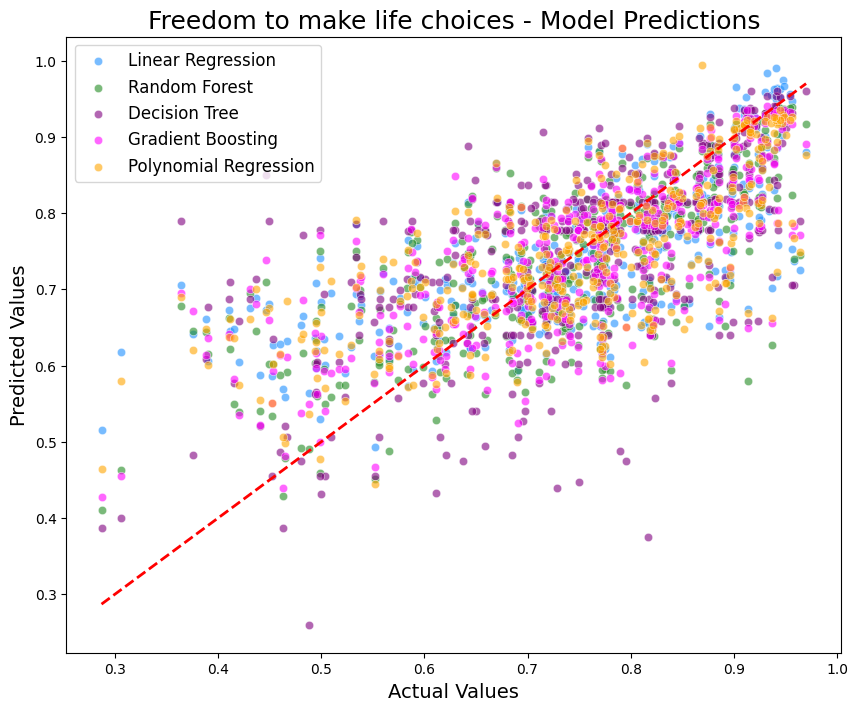

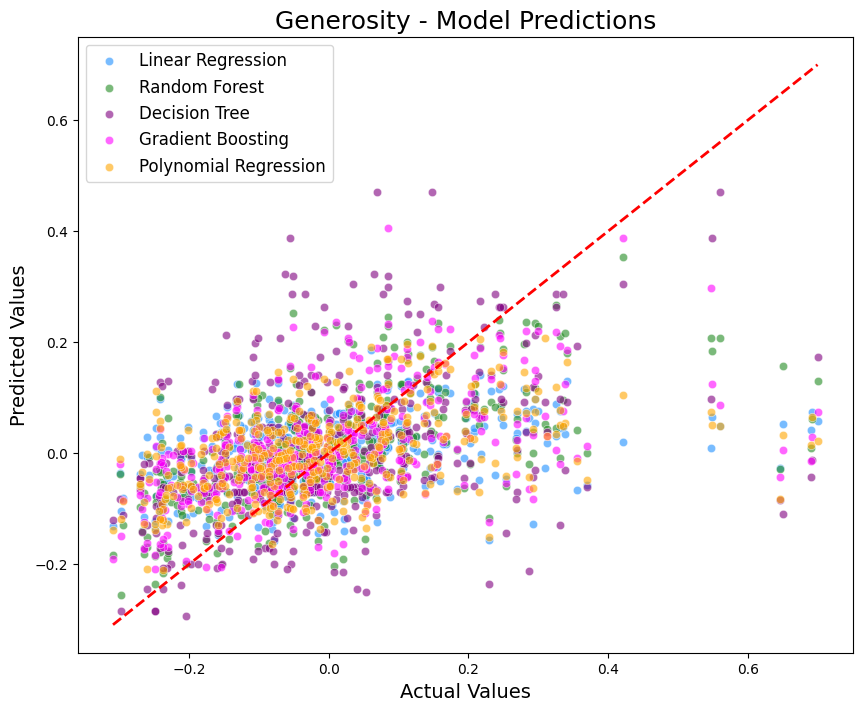

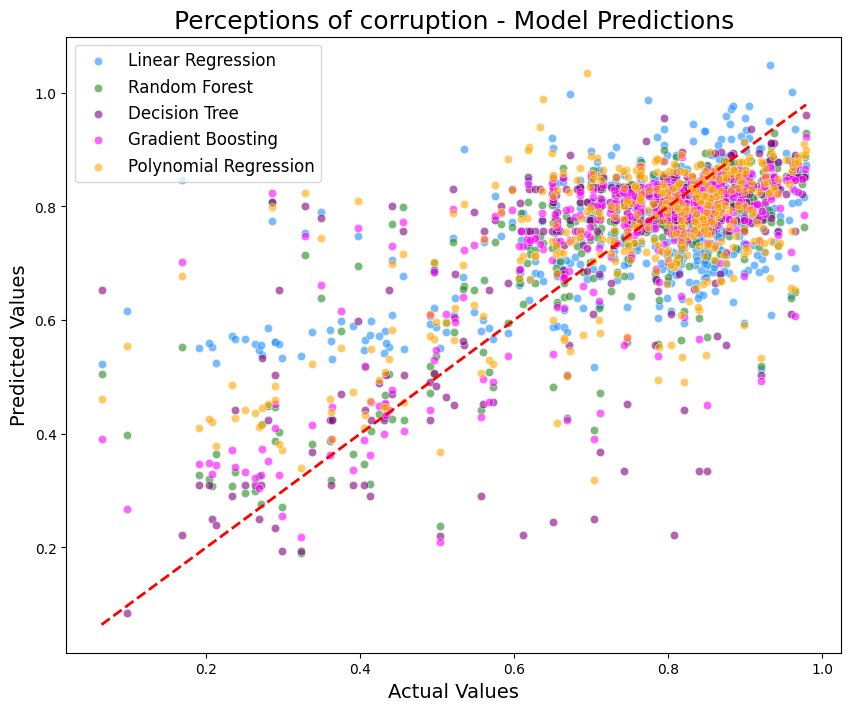

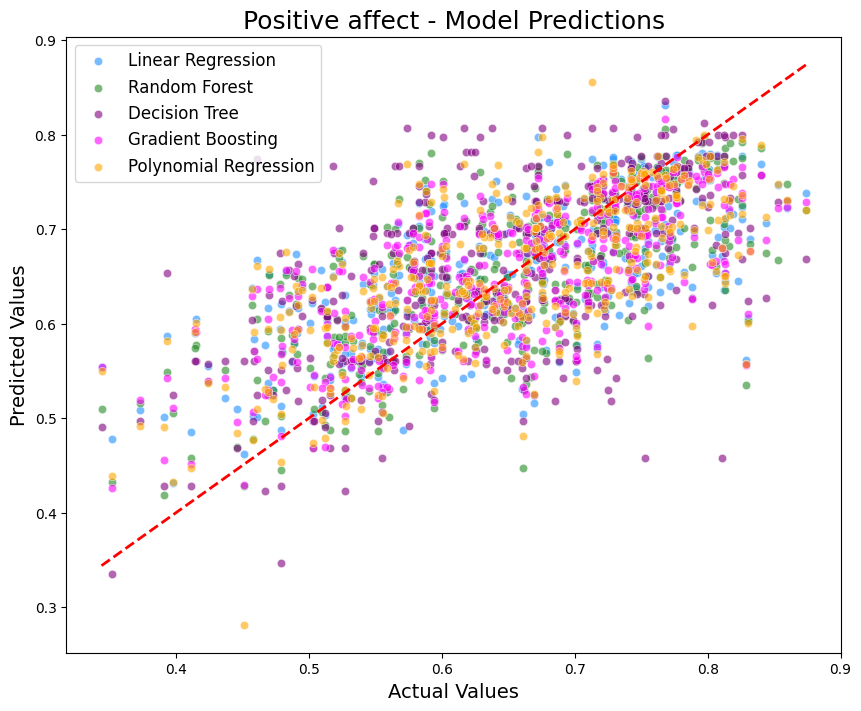

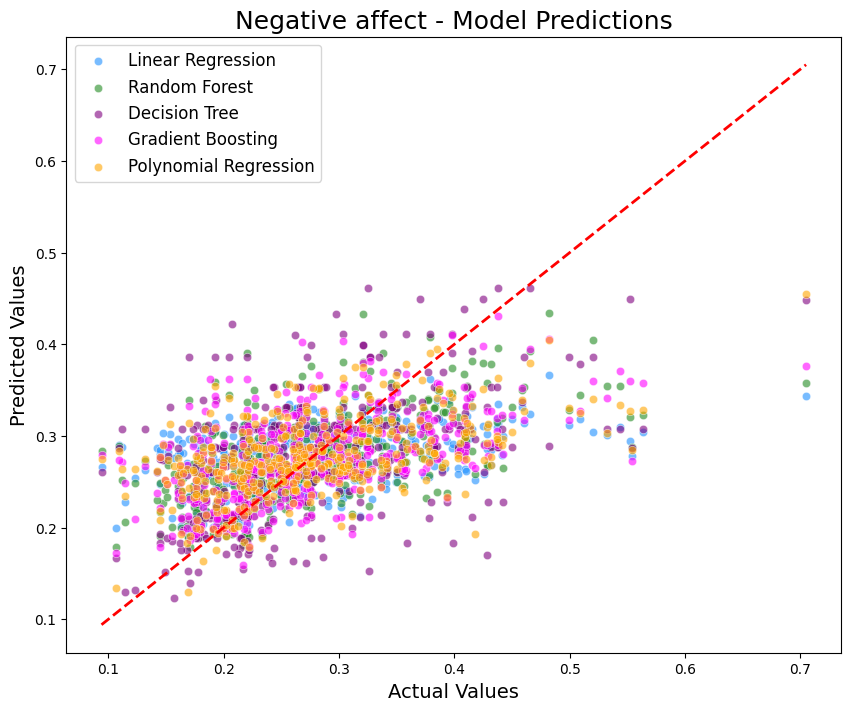

In [10]:
# HyperParameter Tuning
# a) Randomized Search Cross-Validation

import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

# Define features and figure setup
feature_list = ['Life Ladder', 'Freedom to make life choices', 'Generosity',
                'Perceptions of corruption', 'Positive affect', 'Negative affect']

# Hyperparameter grids for each model
param_grids = {
    'RandomForestRegressor': {
        'n_estimators': [50, 100, 150],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10]
    },
    'DecisionTreeRegressor': {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10]
    },
    'GradientBoostingRegressor': {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 10]
    }
}

# Loop for each feature to perform hyperparameter tuning and plot
results = {}
for i, target_feature in enumerate(feature_list):
    features = data_new[feature_list].drop(columns=[target_feature])  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    # Linear Regression (no tuning necessary)
    linear_reg = LinearRegression()
    linear_reg.fit(X_train, y_train)
    y_pred_lr = linear_reg.predict(X_test)

    # Random Forest with RandomizedSearchCV
    rf = RandomForestRegressor(random_state=42)
    rf_search = RandomizedSearchCV(rf, param_grids['RandomForestRegressor'], n_iter=10, cv=3, random_state=42)
    rf_search.fit(X_train, y_train)
    y_pred_rf = rf_search.best_estimator_.predict(X_test)

    # Decision Tree with RandomizedSearchCV
    dt = DecisionTreeRegressor(random_state=42)
    dt_search = RandomizedSearchCV(dt, param_grids['DecisionTreeRegressor'], n_iter=10, cv=3, random_state=42)
    dt_search.fit(X_train, y_train)
    y_pred_dt = dt_search.best_estimator_.predict(X_test)

    # Gradient Boosting with RandomizedSearchCV
    gb = GradientBoostingRegressor(random_state=42)
    gb_search = RandomizedSearchCV(gb, param_grids['GradientBoostingRegressor'], n_iter=10, cv=3, random_state=42)
    gb_search.fit(X_train, y_train)
    y_pred_gb = gb_search.best_estimator_.predict(X_test)

    # Polynomial Regression with PolynomialFeatures
    poly = PolynomialFeatures(degree=2)  # Degree can be tuned if needed
    X_poly_train = poly.fit_transform(X_train)
    X_poly_test = poly.transform(X_test)
    poly_reg = LinearRegression()
    poly_reg.fit(X_poly_train, y_train)
    y_pred_poly = poly_reg.predict(X_poly_test)

    # Store the results for plotting
    results[target_feature] = {
        'Actual': y_test,
        'Linear Regression': y_pred_lr,
        'Random Forest': y_pred_rf,
        'Decision Tree': y_pred_dt,
        'Gradient Boosting': y_pred_gb,
        'Polynomial Regression': y_pred_poly
    }

for feature, predictions in results.items():
    df = pd.DataFrame(predictions)  # Convert predictions to DataFrame

    plt.figure(figsize=(10, 8))  # Set a larger figure size per plot

    # Plot each model's predictions against the actual values for the current feature
    sns.scatterplot(data=df, x='Actual', y='Linear Regression', color="dodgerblue", label="Linear Regression", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Random Forest', color="forestgreen", label="Random Forest", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Decision Tree', color="purple", label="Decision Tree", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Gradient Boosting', color="magenta", label="Gradient Boosting", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Polynomial Regression', color="orange", label="Polynomial Regression", alpha=0.6)

    # Reference line for perfect predictions
    plt.plot([df['Actual'].min(), df['Actual'].max()], [df['Actual'].min(), df['Actual'].max()], 'r--', linewidth=2)

    # Titles and labels
    plt.title(f"{feature} - Model Predictions", fontsize=18)
    plt.xlabel("Actual Values", fontsize=14)
    plt.ylabel("Predicted Values", fontsize=14)
    plt.legend(fontsize=12, loc='upper left')

    plt.show()


Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fi

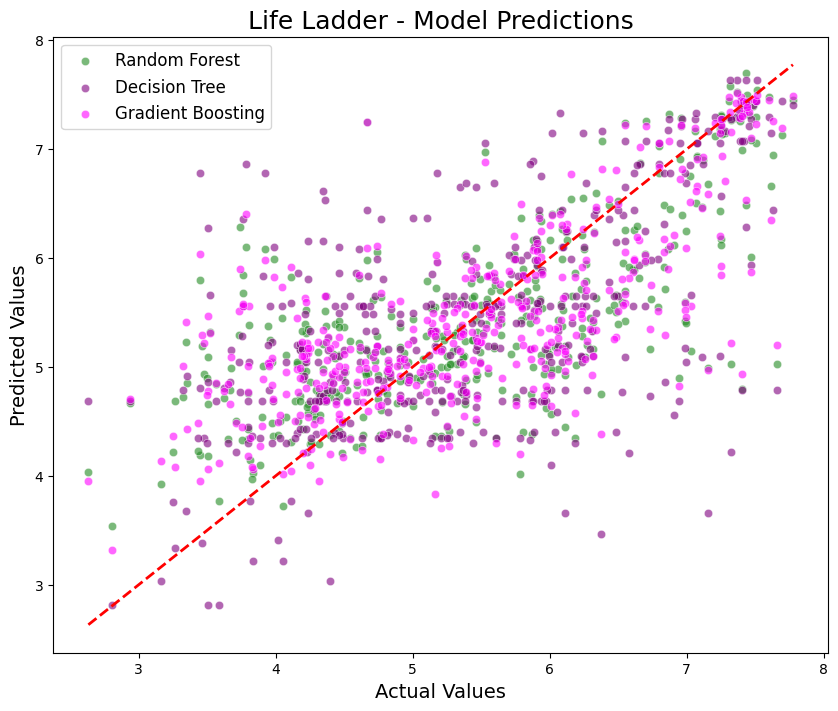

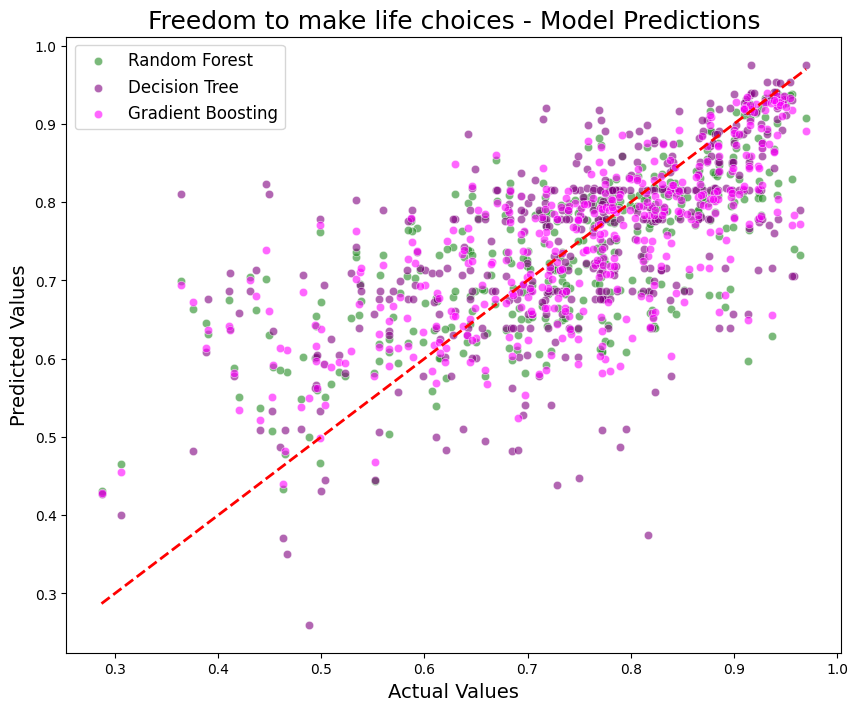

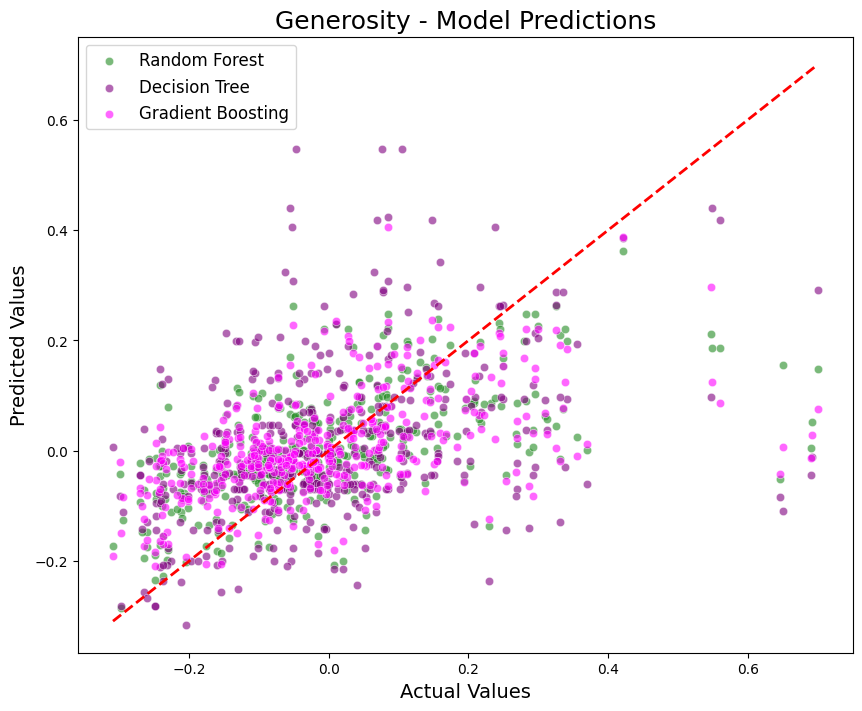

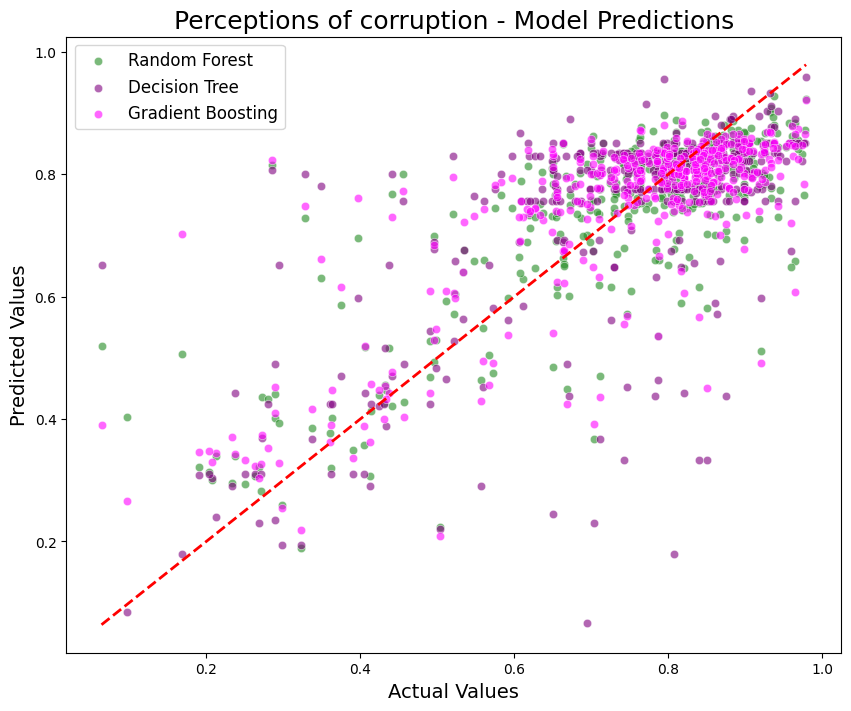

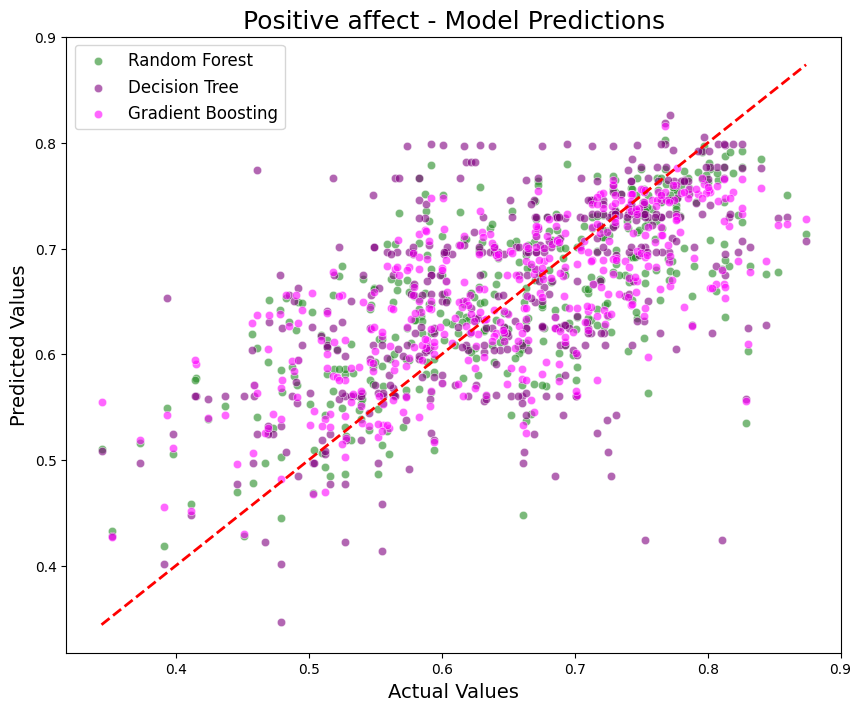

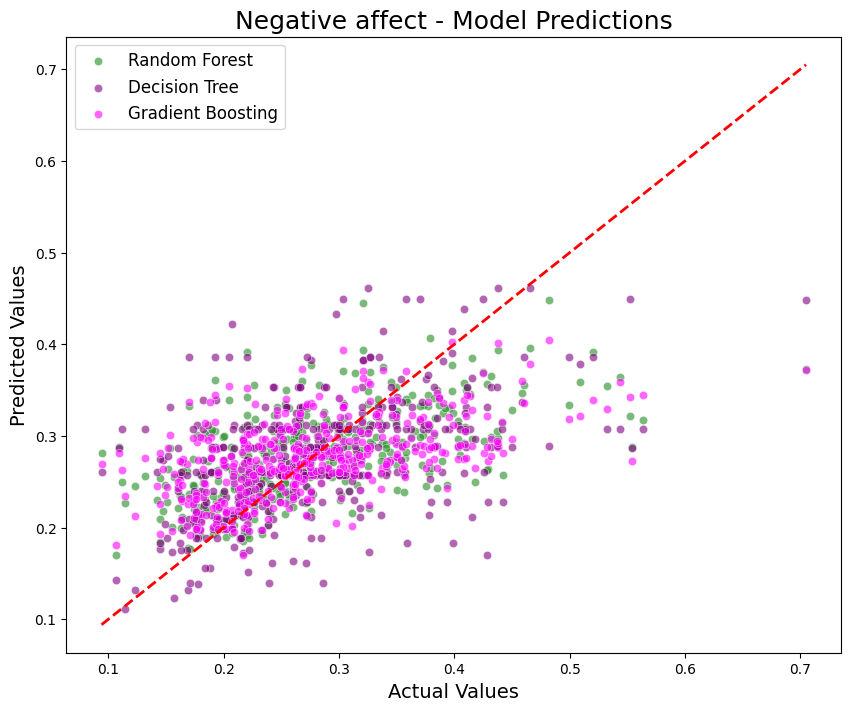

In [11]:
!pip install pandas scikit-learn matplotlib seaborn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import mean_squared_error


# Optimized parameter grids for quicker execution
feature_list = ['Life Ladder', 'Freedom to make life choices', 'Generosity',
                'Perceptions of corruption', 'Positive affect', 'Negative affect']

results = {}
for i, target_feature in enumerate(feature_list):
    # Select only numerical features for training and drop the target feature:
    numerical_features = data_new[feature_list].select_dtypes(include=np.number).drop(columns=[target_feature], errors='ignore')
    features = numerical_features # Use only numerical features
    target = data_new[target_feature]

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

param_grid_rf = {
    'n_estimators': [50],       # Reduced options
    'max_depth': [None, 10],
    'min_samples_split': [5]    # Single value to reduce combinations
}

param_grid_gb = {
    'n_estimators': [50],
    'learning_rate': [0.1],     # Single value to simplify search
    'max_depth': [3, 5]
}

param_grid_dt = {
    'max_depth': [10],          # Reduced to single depth level
    'min_samples_split': [5]
}

# Adjusted model dictionary with reduced grid sizes and CV folds
models = {
    'Random Forest': (RandomForestRegressor(random_state=42), param_grid_rf),
    'Gradient Boosting': (GradientBoostingRegressor(random_state=42), param_grid_gb),
    'Decision Tree': (DecisionTreeRegressor(random_state=42), param_grid_dt)
}

for target_feature in feature_list:
    # Select only numerical features for training and drop the target feature:
    numerical_features = data_new[feature_list].select_dtypes(include=np.number).drop(columns=[target_feature], errors='ignore')

    # Use only numerical features for X
    X = numerical_features
    y = data_new[target_feature]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    predictions = {'Actual': y_test}

    for model_name, (model, param_grid) in models.items():
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                                   scoring='neg_mean_squared_error', cv=3, n_jobs=-1, verbose=1)  # 3-fold CV
        grid_search.fit(X_train, y_train)  # Now fitting with only numerical features

        best_model = grid_search.best_estimator_
        y_pred = best_model.predict(X_test)
        predictions[model_name] = y_pred

    results[target_feature] = predictions

# Visualization (same as before)
for feature, predictions in results.items():
    df = pd.DataFrame(predictions)
    plt.figure(figsize=(10, 8))
    sns.scatterplot(data=df, x='Actual', y='Random Forest', color="forestgreen", label="Random Forest", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Decision Tree', color="purple", label="Decision Tree", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Gradient Boosting', color="magenta", label="Gradient Boosting", alpha=0.6)
    plt.plot([df['Actual'].min(), df['Actual'].max()], [df['Actual'].min(), df['Actual'].max()], 'r--', linewidth=2)
    plt.title(f"{feature} - Model Predictions", fontsize=18)
    plt.xlabel("Actual Values", fontsize=14)
    plt.ylabel("Predicted Values", fontsize=14)
    plt.legend(fontsize=12, loc='upper left')
    plt.show()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.8/362.8 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.2/233.2 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 2.5 MB/s eta 0:00:00


[I 2024-10-30 07:19:41,524] A new study created in memory with name: no-name-0723b871-0d48-4041-a3e9-667cb9c96272
[I 2024-10-30 07:19:42,817] Trial 0 finished with value: 0.6427800462777823 and parameters: {'n_estimators': 70, 'max_depth': 14, 'min_samples_split': 4}. Best is trial 0 with value: 0.6427800462777823.
[I 2024-10-30 07:19:44,451] Trial 1 finished with value: 0.6360746675907428 and parameters: {'n_estimators': 106, 'max_depth': 18, 'min_samples_split': 4}. Best is trial 1 with value: 0.6360746675907428.
[I 2024-10-30 07:19:45,577] Trial 2 finished with value: 0.670756053208341 and parameters: {'n_estimators': 130, 'max_depth': 7, 'min_samples_split': 6}. Best is trial 1 with value: 0.6360746675907428.
[I 2024-10-30 07:19:46,879] Trial 3 finished with value: 0.6424015654216644 and parameters: {'n_estimators': 87, 'max_depth': 10, 'min_samples_split': 2}. Best is trial 1 with value: 0.6360746675907428.
[I 2024-10-30 07:19:48,164] Trial 4 finished with value: 0.642601462090787

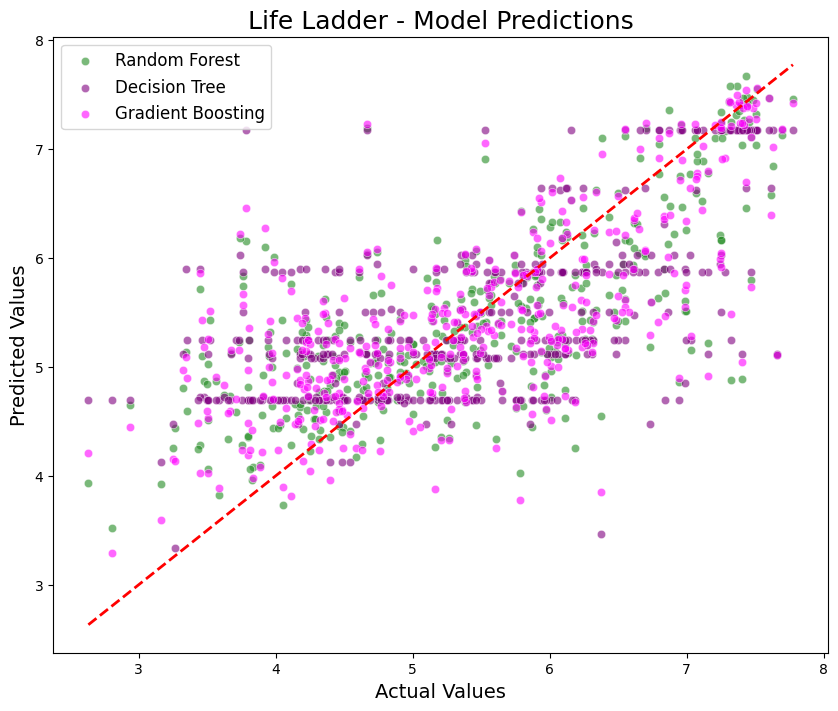

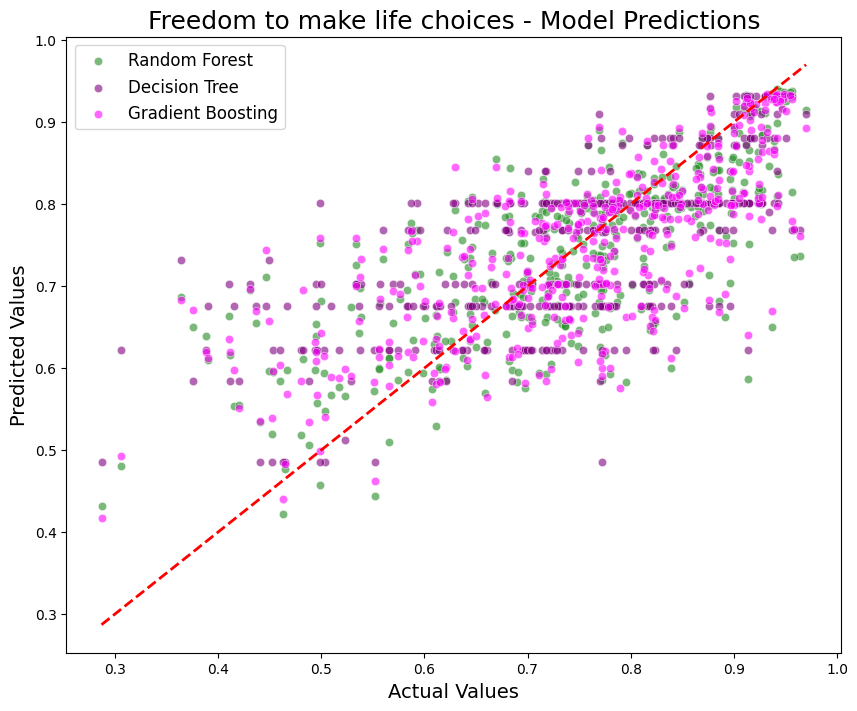

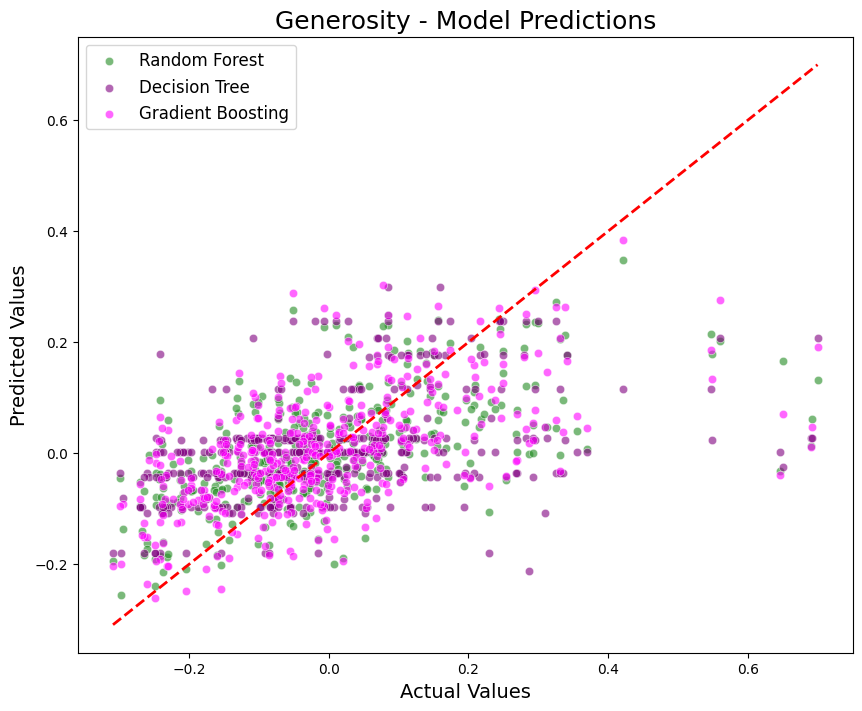

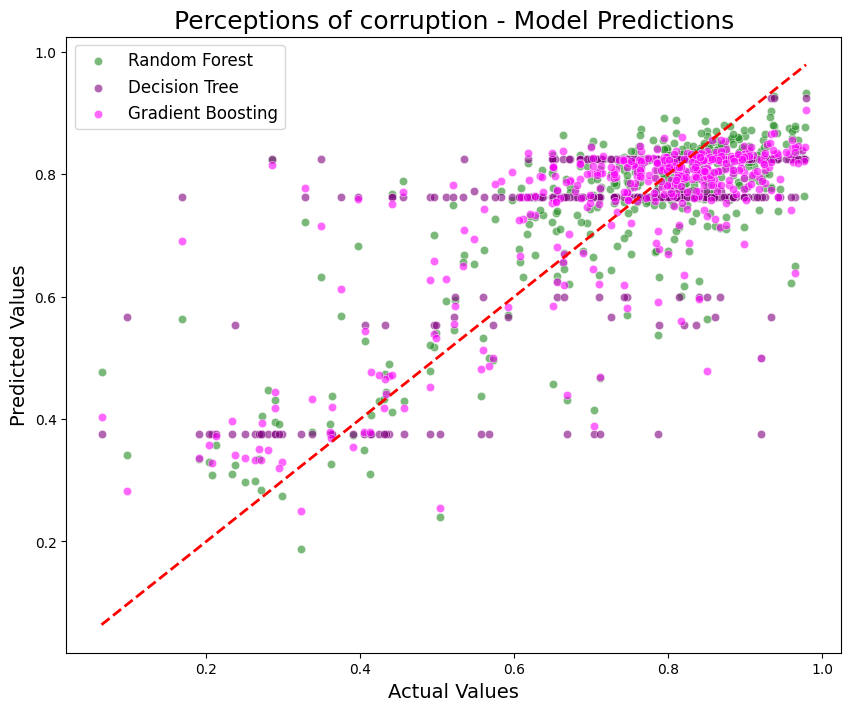

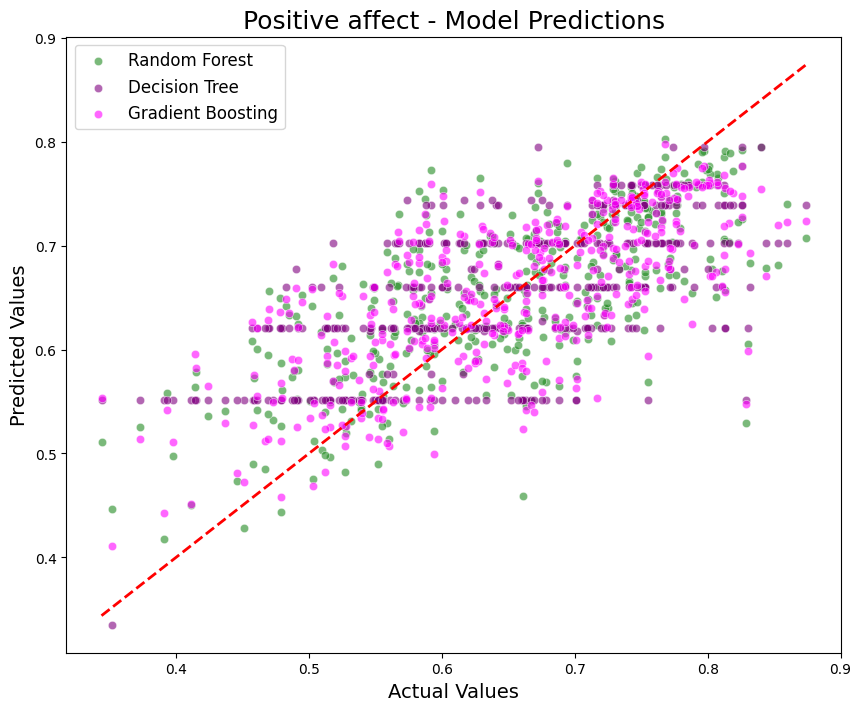

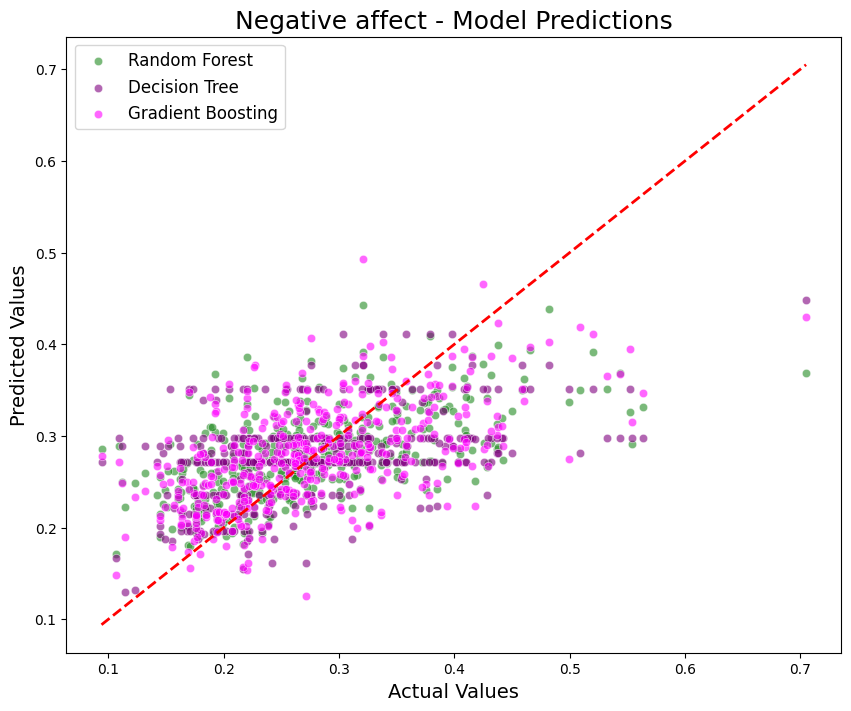

In [12]:
!pip install optuna
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import optuna
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# List of target features
feature_list = ['Life Ladder', 'Freedom to make life choices', 'Generosity',
                'Perceptions of corruption', 'Positive affect', 'Negative affect']

results = {}

# Function for Bayesian Optimization with Optuna
def objective(trial, X_train, y_train, X_test, y_test, model_name):
    if model_name == 'Random Forest':
        model = RandomForestRegressor(
            n_estimators=trial.suggest_int("n_estimators", 50, 150),
            max_depth=trial.suggest_int("max_depth", 3, 20),
            min_samples_split=trial.suggest_int("min_samples_split", 2, 10),
            random_state=42
        )

    elif model_name == 'Gradient Boosting':
        model = GradientBoostingRegressor(
            n_estimators=trial.suggest_int("n_estimators", 50, 150),
            learning_rate=trial.suggest_float("learning_rate", 0.01, 0.2),
            max_depth=trial.suggest_int("max_depth", 3, 10),
            random_state=42
        )

    elif model_name == 'Decision Tree':
        model = DecisionTreeRegressor(
            max_depth=trial.suggest_int("max_depth", 3, 20),
            min_samples_split=trial.suggest_int("min_samples_split", 2, 10),
            random_state=42
        )

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)

    return mse  # Minimize MSE

# Main loop to optimize and evaluate each model for each target feature
for target_feature in feature_list:
    numerical_features = data_new[feature_list].select_dtypes(include=np.number).drop(columns=[target_feature], errors='ignore')

    X = numerical_features  # Use only numerical features for predictors
    y = data_new[target_feature]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    predictions = {'Actual': y_test}

    for model_name in ['Random Forest', 'Gradient Boosting', 'Decision Tree']:
        # Define the objective function for the current model and target feature
        study = optuna.create_study(direction="minimize")
        study.optimize(lambda trial: objective(trial, X_train, y_train, X_test, y_test, model_name), n_trials=30)

        # Get the best model and evaluate it on the test set
        best_params = study.best_params
        if model_name == 'Random Forest':
            best_model = RandomForestRegressor(**best_params, random_state=42)
        elif model_name == 'Gradient Boosting':
            best_model = GradientBoostingRegressor(**best_params, random_state=42)
        elif model_name == 'Decision Tree':
            best_model = DecisionTreeRegressor(**best_params, random_state=42)

        best_model.fit(X_train, y_train)
        y_pred = best_model.predict(X_test)
        predictions[model_name] = y_pred

    results[target_feature] = predictions

# Visualization (same as before)
for feature, predictions in results.items():
    df = pd.DataFrame(predictions)
    plt.figure(figsize=(10, 8))
    sns.scatterplot(data=df, x='Actual', y='Random Forest', color="forestgreen", label="Random Forest", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Decision Tree', color="purple", label="Decision Tree", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Gradient Boosting', color="magenta", label="Gradient Boosting", alpha=0.6)
    plt.plot([df['Actual'].min(), df['Actual'].max()], [df['Actual'].min(), df['Actual'].max()], 'r--', linewidth=2)
    plt.title(f"{feature} - Model Predictions", fontsize=18)
    plt.xlabel("Actual Values", fontsize=14)
    plt.ylabel("Predicted Values", fontsize=14)
    plt.legend(fontsize=12, loc='upper left')
    plt.show()
